Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


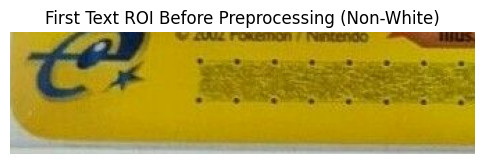

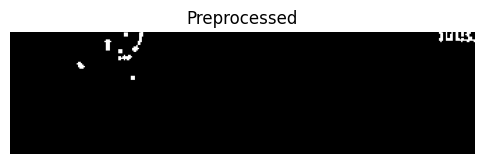

OCR result: []


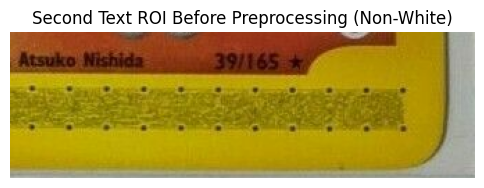

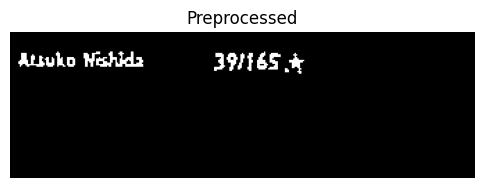

OCR result: ['AJuko Hahd', '39/165 4']


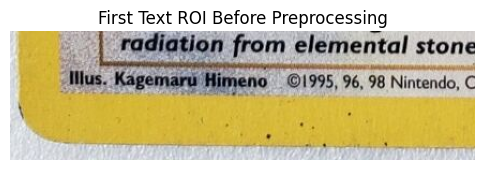

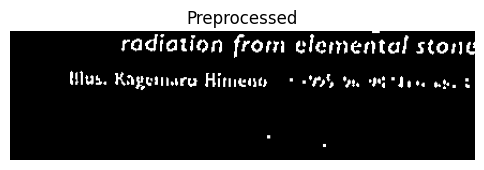

OCR result: ['radiation from elcmental stone', 'Hlus', 'Kagetllwru Hirneutr']


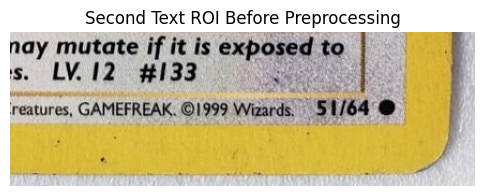

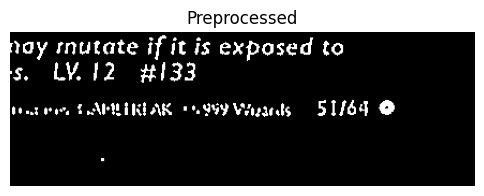

OCR result: ['ay rnutate if it is exposed to', 'LV: 12', '#133', "Mimak '95y Vxuat Is", '51/64 0']


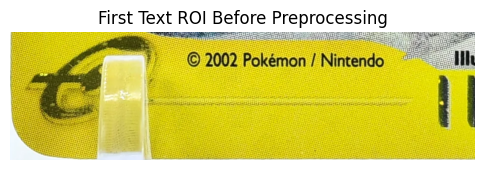

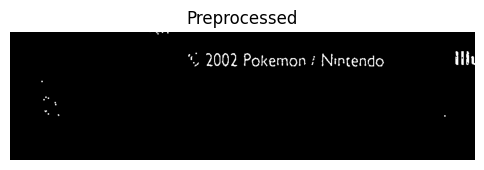

OCR result: ['2002 Pokemon', 'Ninrendo']


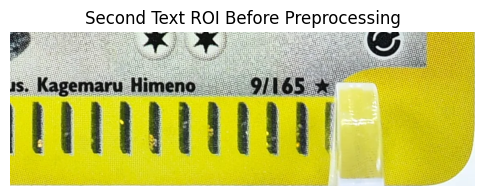

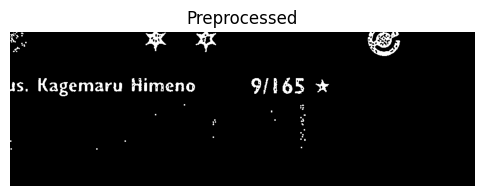

OCR result: ['JS,', 'Kagemaru Himeno', '9/165']


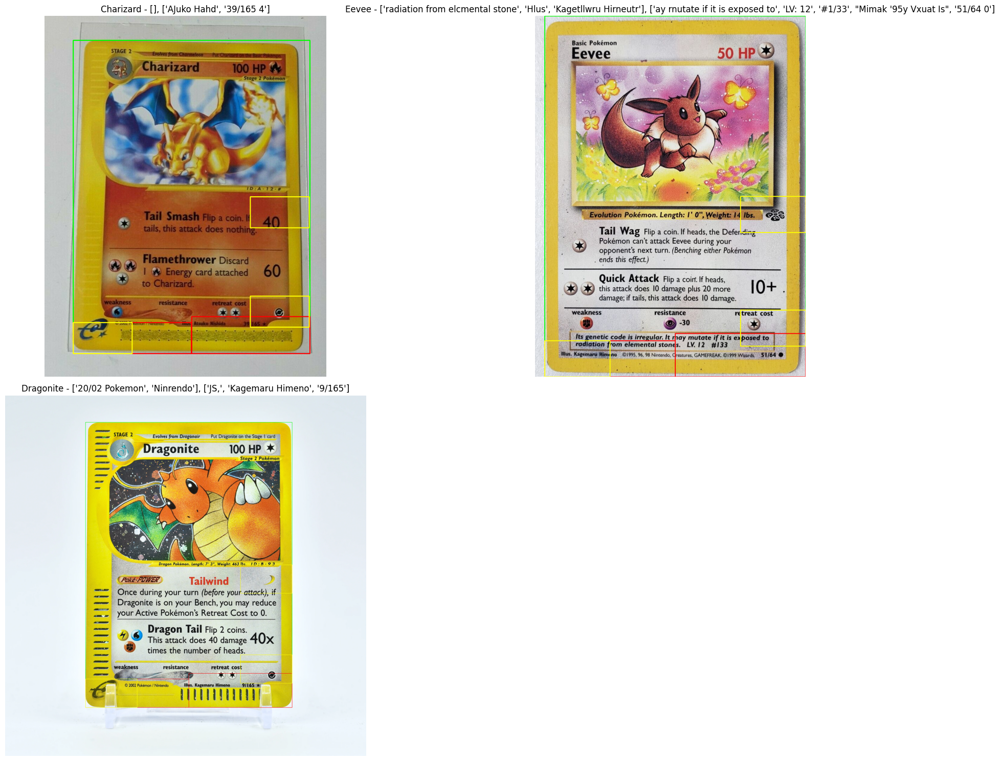

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import easyocr
from PIL import Image
from collections import Counter
import re


# Initialize EasyOCR reader (use 'en' for English)
reader = easyocr.Reader(['en'])

# Function to classify a card as white or non-white
def classify_card(image_rgb):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    mean_brightness = np.mean(gray)
    
    if mean_brightness > 150:
        return "white"
    else:
        return "non_white"


# Function to adjust brightness and contrast
def adjust_brightness_contrast(image, alpha=2, beta=25):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)


# Function to display images for debugging
def debug_show_image(image, title="Image"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()


# Preprocessing to identify all colors that are not black and turn them into white
def ocr_preprocessing1(image_roi):
    roi_gray = cv2.cvtColor(image_roi, cv2.COLOR_BGR2GRAY)
    _, roi_thresh_black = cv2.threshold(roi_gray, 30, 255, cv2.THRESH_BINARY)
    
    roi_contrast = adjust_brightness_contrast(roi_thresh_black, alpha=1.5, beta=30)
    roi_blur = cv2.GaussianBlur(roi_contrast, (3, 3), 0)
    roi_thresh = cv2.adaptiveThreshold(roi_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY_INV, 11, 2)
    roi_sharpen = cv2.filter2D(roi_thresh, -1, np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))
    
    debug_show_image(roi_sharpen, title="Preprocessed")
    return roi_sharpen


# OCR processing with EasyOCR
def perform_ocr_easyocr(image_roi):
    # Perform OCR using EasyOCR
    result = reader.readtext(image_roi, detail=0)
    print(f"OCR result: {result}")
    
    return result

# Function to replace "*" with "/" and correct numeric patterns
def postprocess_ocr_output(ocr_results):
    processed_results = []
    
    for result in ocr_results:
        # Step 1: Replace "*" with "/"
        corrected_result = result.replace("*", "/")
        
        # Step 2: Ensure only one "/" and correct numeric patterns
        if corrected_result.count("/") == 0:  # Only process if no "/" exists
            def correct_numeric_pattern(match):
                left_digits = match.group(1)
                right_digits = match.group(2)
                
                # Ensure the right side is <= 300 and left side is no more than 30 greater than right side
                if 0 < int(right_digits) <= 300 and int(left_digits) <= int(right_digits) + 30:
                    return f"{left_digits}/{right_digits}"
                else:
                    return f"{left_digits}{right_digits}"  # Leave unchanged if the condition doesn't match

            # Match 1-3 digits followed by 2-3 digits
            numeric_pattern = r'(\d{1,3})(\d{2,3})'

            # Apply regex correction to detect missing slashes
            corrected_result = re.sub(numeric_pattern, correct_numeric_pattern, corrected_result)

        # Step 3: Handle misidentified digits (e.g., 51164 -> 51/64)
        def handle_duplicate_digits(match):
            left_digits = match.group(1)
            duplicate_digit = match.group(2)
            right_digits = match.group(3)

            # Remove the duplicated middle digit and create the correct format
            return f"{left_digits}/{right_digits}"

        # Look for patterns like 51164 where there is an extra middle digit
        duplicate_digit_pattern = r'(\d{2})(\d)\2(\d{2})'
        corrected_result = re.sub(duplicate_digit_pattern, handle_duplicate_digits, corrected_result)
        
        # Step 4: Handle the letter followed by digits pattern (up to four letters followed by 1-3 digits)
        letter_number_pattern = r'([a-zA-Z]{1,4})(\d{1,3})'
        corrected_result = re.sub(letter_number_pattern, r'\1\2', corrected_result)

        # Step 5: Ensure no more than one "/" is added
        if corrected_result.count("/") > 1:
            parts = corrected_result.split("/")
            corrected_result = f"{parts[0]}/{parts[1]}"  # Take only the first valid pair

        # Add the corrected result to the list
        processed_results.append(corrected_result)
    
    return processed_results

# Function to process lists of OCR results
def process_ocr_results(ocr_results):
    return postprocess_ocr_output(ocr_results)

# Function to extract bounding boxes and run OCR on white cards
def draw_bounding_box_full_card_with_rois(image_bgr):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI (for OCR) ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_bgr[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)
        processed_ocr_results_first = process_ocr_results(ocr_results_first)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_bgr[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)
        processed_ocr_results_second = process_ocr_results(ocr_results_second)

        # --- Set Symbol ROIs ---
        roi_bottom_left = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)


        # Draw bounding box and ROIs
        image_with_rois = image_bgr.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        return image_with_rois, processed_ocr_results_first, processed_ocr_results_second

    else:
        print("No contours found.")
        return image_bgr, None, None


# Function to extract bounding boxes and run OCR on non-white cards
def draw_bounding_boxes(image_rgb, threshold_value):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    _, thresholded = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_rgb[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing (Non-White)")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)
        processed_ocr_results_first = process_ocr_results(ocr_results_first)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_rgb[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing (Non-White)")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)
        processed_ocr_results_second = process_ocr_results(ocr_results_second)

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)

        # Draw bounding box and ROIs
        image_with_rois = image_rgb.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        
        return image_with_rois, processed_ocr_results_first, processed_ocr_results_second
    else:
        print("No contours found.")
        return image_rgb, None, None


# Main function to handle both white and non-white cards
def draw_roi_boxes_with_dynamic_threshold_with_rois(image_rgb):
    card_type = classify_card(image_rgb)

    if card_type == "white":
        image_with_bounding_box, ocr_results_first, ocr_results_second = draw_bounding_box_full_card_with_rois(image_rgb)
    else:
        threshold_value = 160
        image_with_bounding_box, ocr_results_first, ocr_results_second = draw_bounding_boxes(image_rgb, threshold_value)

    return image_with_bounding_box, ocr_results_first, ocr_results_second


# Apply this logic to your local images and display results

# Test with the images (replace with actual image paths)
charizard_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\image-0.jpg')  # Replace with actual path
charizard_rgb = cv2.cvtColor(charizard_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

eevee_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\s-l1200.jpg')  # Replace with actual path
eevee_rgb = cv2.cvtColor(eevee_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

dragonite_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\e-reader.webp')  # Replace with actual path
dragonite_rgb = cv2.cvtColor(dragonite_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

# Apply the dynamic threshold function to all images
charizard_output, charizard_ocr_results_first, charizard_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(charizard_rgb)
eevee_output, eevee_ocr_results_first, eevee_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(eevee_rgb)
dragonite_output, dragonite_ocr_results_first, dragonite_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(dragonite_rgb)


# Display the results for all cards with classification
plt.figure(figsize=(20, 15))

# Charizard
plt.subplot(2, 2, 1)
plt.imshow(charizard_output)
plt.title(f"Charizard - {charizard_ocr_results_first}, {charizard_ocr_results_second}")
plt.axis("off")


# Eevee
plt.subplot(2, 2, 2)
plt.imshow(eevee_output)
plt.title(f"Eevee - {eevee_ocr_results_first}, {eevee_ocr_results_second}")
plt.axis("off")

# Dragonite
plt.subplot(2, 2, 3)
plt.imshow(dragonite_output)
plt.title(f"Dragonite - {dragonite_ocr_results_first}, {dragonite_ocr_results_second}")
plt.axis("off")

plt.tight_layout()
plt.show()

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


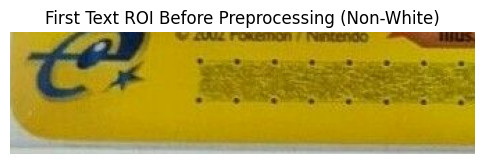

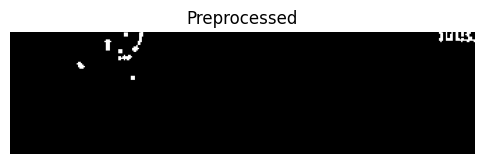

OCR result: []


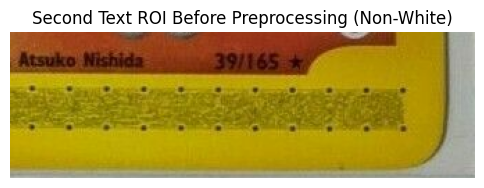

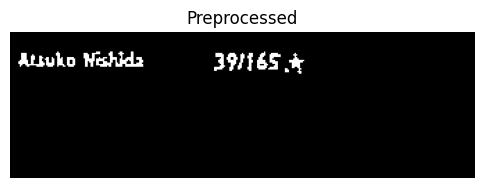

OCR result: ['AJuko Hahd', '39/165 4']


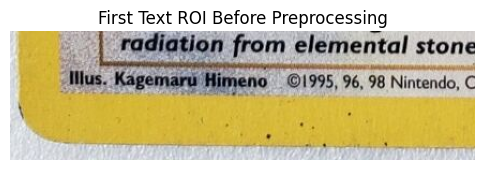

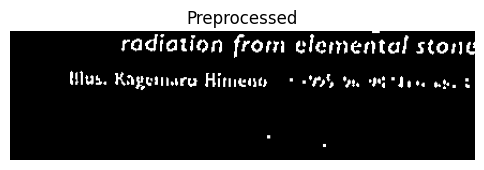

OCR result: ['radiation from elcmental stone', 'Hlus', 'Kagetllwru Hirneutr']


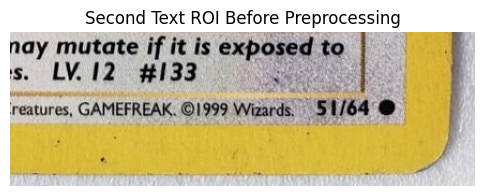

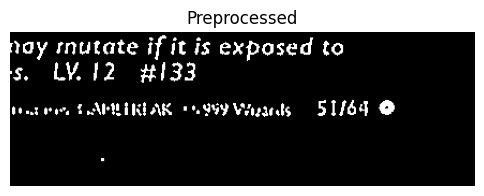

OCR result: ['ay rnutate if it is exposed to', 'LV: 12', '#133', "Mimak '95y Vxuat Is", '51/64 0']


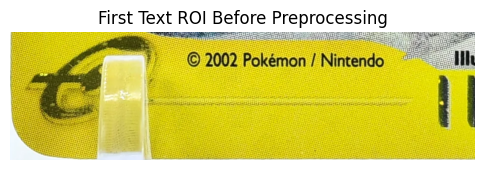

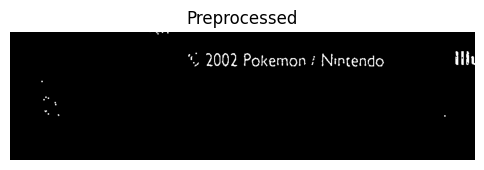

OCR result: ['2002 Pokemon', 'Ninrendo']


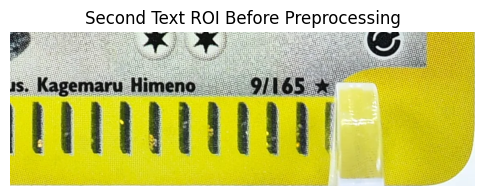

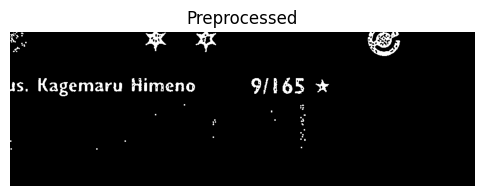

OCR result: ['JS,', 'Kagemaru Himeno', '9/165']


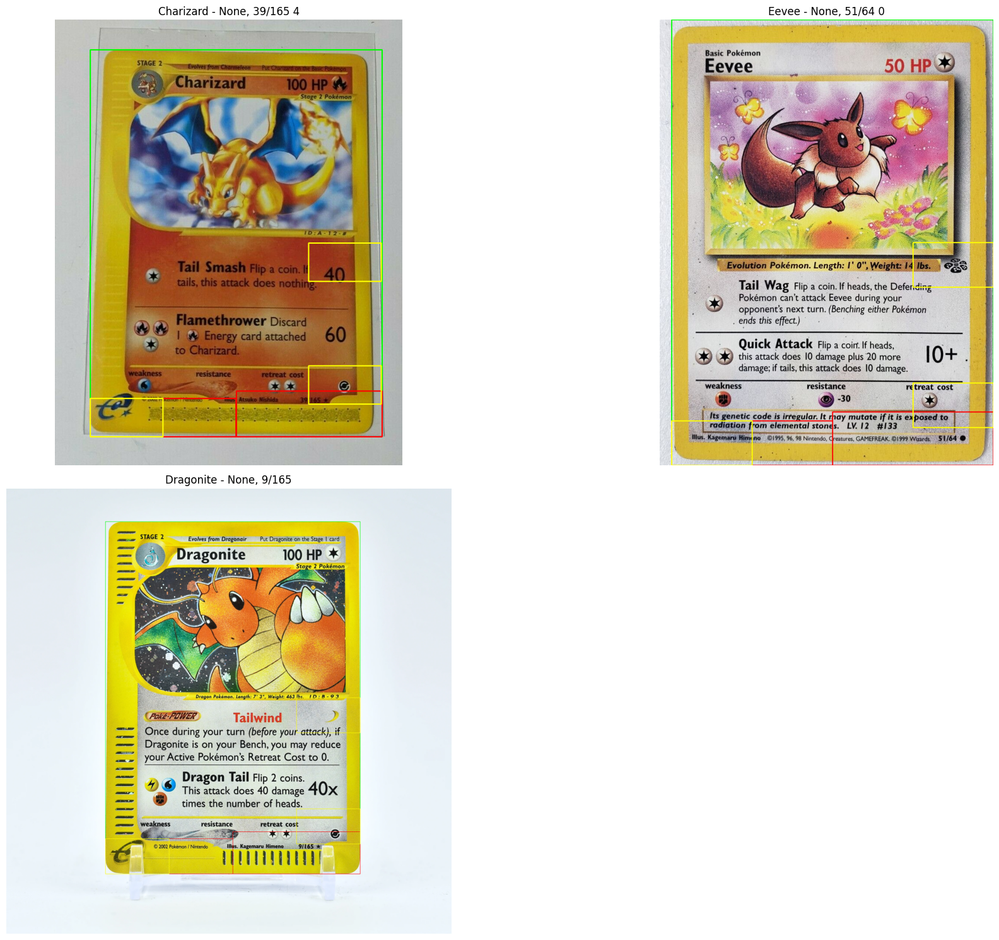

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import easyocr
from PIL import Image
from collections import Counter
import re


# Initialize EasyOCR reader (use 'en' for English)
reader = easyocr.Reader(['en'])

# Function to classify a card as white or non-white
def classify_card(image_rgb):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    mean_brightness = np.mean(gray)
    
    if mean_brightness > 150:
        return "white"
    else:
        return "non_white"


# Function to adjust brightness and contrast
def adjust_brightness_contrast(image, alpha=2, beta=25):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)


# Function to display images for debugging
def debug_show_image(image, title="Image"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()


# Preprocessing to identify all colors that are not black and turn them into white
def ocr_preprocessing1(image_roi):
    roi_gray = cv2.cvtColor(image_roi, cv2.COLOR_BGR2GRAY)
    _, roi_thresh_black = cv2.threshold(roi_gray, 30, 255, cv2.THRESH_BINARY)
    
    roi_contrast = adjust_brightness_contrast(roi_thresh_black, alpha=1.5, beta=30)
    roi_blur = cv2.GaussianBlur(roi_contrast, (3, 3), 0)
    roi_thresh = cv2.adaptiveThreshold(roi_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY_INV, 11, 2)
    roi_sharpen = cv2.filter2D(roi_thresh, -1, np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))
    
    debug_show_image(roi_sharpen, title="Preprocessed")
    return roi_sharpen


# OCR processing with EasyOCR
def perform_ocr_easyocr(image_roi):
    # Perform OCR using EasyOCR
    result = reader.readtext(image_roi, detail=0)
    print(f"OCR result: {result}")
    
    return result

# Function to process lists of OCR results
def process_ocr_results(ocr_results_first, ocr_results_second):
    # Define the patterns for the two cases
    pattern_letters_digits = r'[a-zA-Z]{2,4}\d{1,3}'  # 2-4 letters followed by 1-3 numbers
    pattern_numbers_slash = r'\d{1,3}/\d{2,3}'  # 1-3 numbers followed by / and 2-3 numbers

    def find_matching_string(ocr_results):
        """Helper function to find the first valid matching string."""
        for result in ocr_results:
            if re.match(pattern_letters_digits, result) or re.match(pattern_numbers_slash, result):
                return result  # Return the first match found
        return None

    # Process both OCR results and look for a match in either
    first_result = find_matching_string(ocr_results_first)
    second_result = find_matching_string(ocr_results_second)

    # If both results contain a match, keep only one (priority to the first result)
    if first_result:
        return first_result, None  # Keep only the first match, discard the second
    elif second_result:
        return None, second_result  # Keep only the second match

    # If no valid match is found, return None for both
    return None, None


# Function to extract bounding boxes and run OCR on white cards
def draw_bounding_box_full_card_with_rois(image_bgr):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI (for OCR) ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_bgr[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_bgr[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # Process the OCR results to ensure only one valid match
        processed_ocr_results_first, processed_ocr_results_second = process_ocr_results(ocr_results_first, ocr_results_second)

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)

        # Draw bounding box and ROIs
        image_with_rois = image_bgr.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        return image_with_rois, processed_ocr_results_first, processed_ocr_results_second

    else:
        print("No contours found.")
        return image_bgr, None, None


# Function to extract bounding boxes and run OCR on non-white cards
def draw_bounding_boxes(image_rgb, threshold_value):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    _, thresholded = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_rgb[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing (Non-White)")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_rgb[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing (Non-White)")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # Process the OCR results to ensure only one valid match
        processed_ocr_results_first, processed_ocr_results_second = process_ocr_results(ocr_results_first, ocr_results_second)

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)

        # Draw bounding box and ROIs
        image_with_rois = image_rgb.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        
        return image_with_rois, processed_ocr_results_first, processed_ocr_results_second
    else:
        print("No contours found.")
        return image_rgb, None, None


# Main function to handle both white and non-white cards
def draw_roi_boxes_with_dynamic_threshold_with_rois(image_rgb):
    card_type = classify_card(image_rgb)

    if card_type == "white":
        image_with_bounding_box, ocr_results_first, ocr_results_second = draw_bounding_box_full_card_with_rois(image_rgb)
    else:
        threshold_value = 160
        image_with_bounding_box, ocr_results_first, ocr_results_second = draw_bounding_boxes(image_rgb, threshold_value)

    return image_with_bounding_box, ocr_results_first, ocr_results_second


# Apply this logic to your local images and display results

# Test with the images (replace with actual image paths)
charizard_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\image-0.jpg')  # Replace with actual path
charizard_rgb = cv2.cvtColor(charizard_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

eevee_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\s-l1200.jpg')  # Replace with actual path
eevee_rgb = cv2.cvtColor(eevee_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

dragonite_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\e-reader.webp')  # Replace with actual path
dragonite_rgb = cv2.cvtColor(dragonite_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

# Apply the dynamic threshold function to all images
charizard_output, charizard_ocr_results_first, charizard_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(charizard_rgb)
eevee_output, eevee_ocr_results_first, eevee_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(eevee_rgb)
dragonite_output, dragonite_ocr_results_first, dragonite_ocr_results_second = draw_roi_boxes_with_dynamic_threshold_with_rois(dragonite_rgb)


# Display the results for all cards with classification
plt.figure(figsize=(20, 15))

# Charizard
plt.subplot(2, 2, 1)
plt.imshow(charizard_output)
plt.title(f"Charizard - {charizard_ocr_results_first}, {charizard_ocr_results_second}")
plt.axis("off")


# Eevee
plt.subplot(2, 2, 2)
plt.imshow(eevee_output)
plt.title(f"Eevee - {eevee_ocr_results_first}, {eevee_ocr_results_second}")
plt.axis("off")

# Dragonite
plt.subplot(2, 2, 3)
plt.imshow(dragonite_output)
plt.title(f"Dragonite - {dragonite_ocr_results_first}, {dragonite_ocr_results_second}")
plt.axis("off")

plt.tight_layout()
plt.show()


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


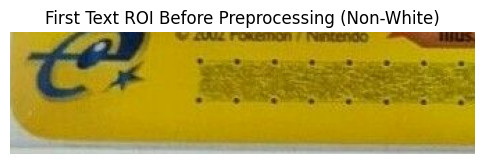

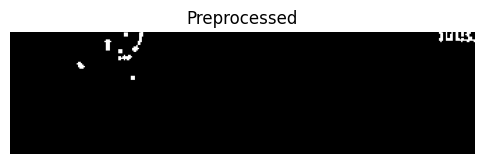

OCR result: []


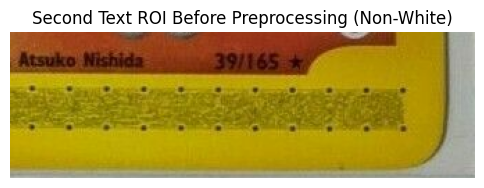

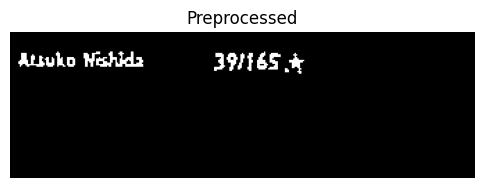

OCR result: ['AJuko Hahd', '39/165 4']


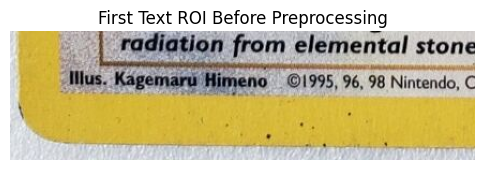

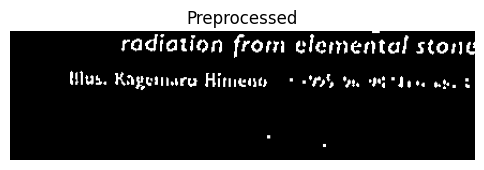

OCR result: ['radiation from elcmental stone', 'Hlus', 'Kagetllwru Hirneutr']


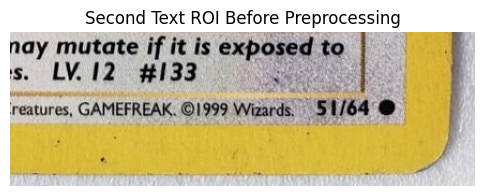

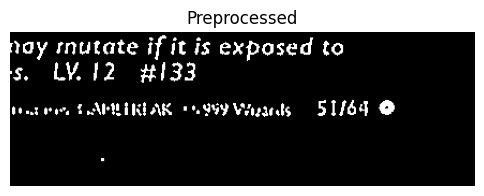

OCR result: ['ay rnutate if it is exposed to', 'LV: 12', '#133', "Mimak '95y Vxuat Is", '51/64 0']


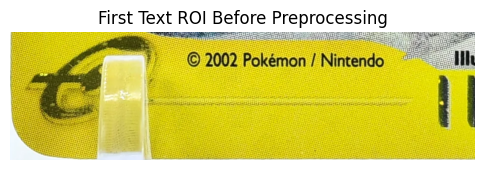

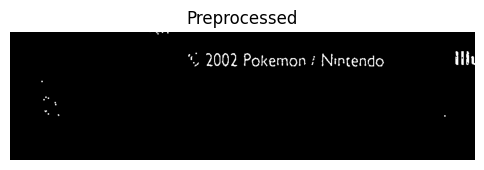

OCR result: ['2002 Pokemon', 'Ninrendo']


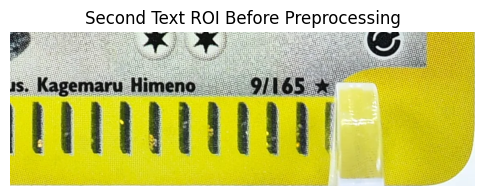

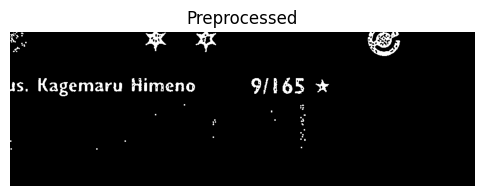

OCR result: ['JS,', 'Kagemaru Himeno', '9/165']


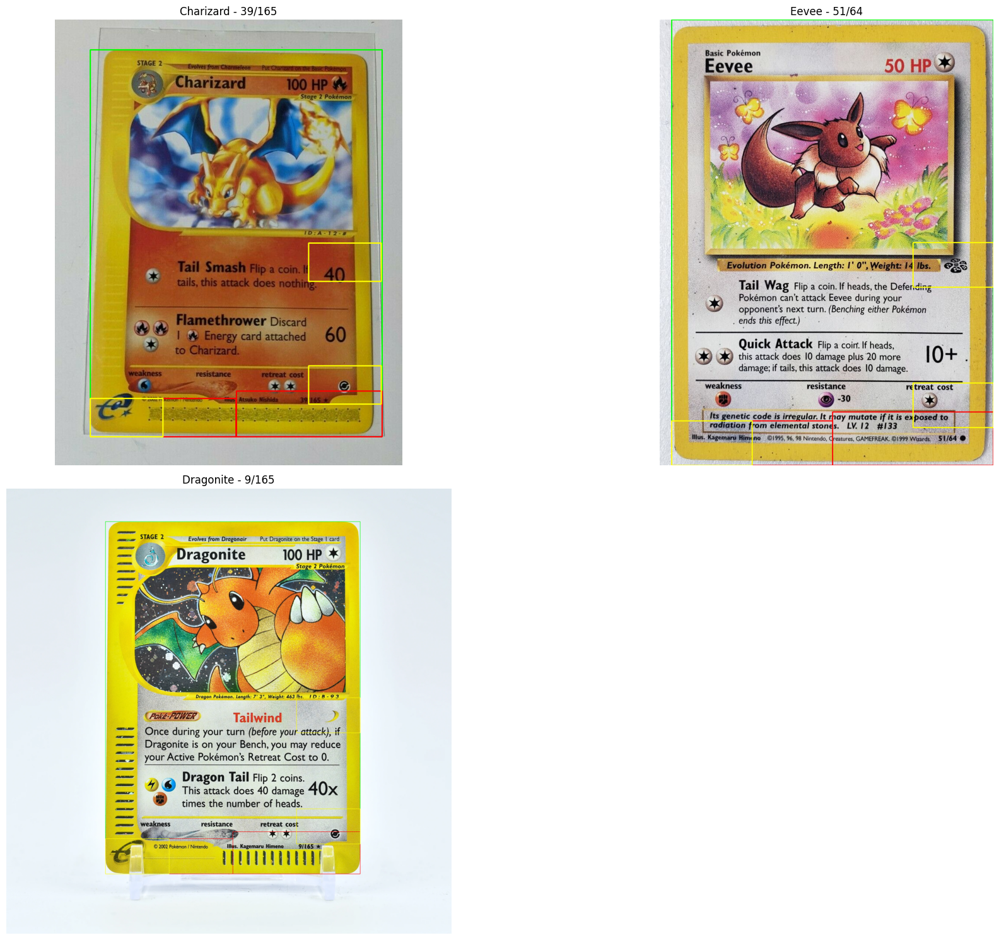

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import easyocr
from PIL import Image
from collections import Counter
import re


# Initialize EasyOCR reader (use 'en' for English)
reader = easyocr.Reader(['en'])

# Function to classify a card as white or non-white
def classify_card(image_rgb):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    mean_brightness = np.mean(gray)
    
    if mean_brightness > 150:
        return "white"
    else:
        return "non_white"


# Function to adjust brightness and contrast
def adjust_brightness_contrast(image, alpha=2, beta=25):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)


# Function to display images for debugging
def debug_show_image(image, title="Image"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()


# Preprocessing to identify all colors that are not black and turn them into white
def ocr_preprocessing1(image_roi):
    roi_gray = cv2.cvtColor(image_roi, cv2.COLOR_BGR2GRAY)
    _, roi_thresh_black = cv2.threshold(roi_gray, 30, 255, cv2.THRESH_BINARY)
    
    roi_contrast = adjust_brightness_contrast(roi_thresh_black, alpha=1.5, beta=30)
    roi_blur = cv2.GaussianBlur(roi_contrast, (3, 3), 0)
    roi_thresh = cv2.adaptiveThreshold(roi_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY_INV, 11, 2)
    roi_sharpen = cv2.filter2D(roi_thresh, -1, np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))
    
    debug_show_image(roi_sharpen, title="Preprocessed")
    return roi_sharpen


# OCR processing with EasyOCR
def perform_ocr_easyocr(image_roi):
    # Perform OCR using EasyOCR
    result = reader.readtext(image_roi, detail=0)
    print(f"OCR result: {result}")
    
    return result

# Function to process OCR results and select only the valid match
def process_ocr_results(ocr_results):
    # Define the patterns for the two cases
    pattern_letters_digits = r'[a-zA-Z]{2,4}\d{1,3}'  # 2-4 letters followed by 1-3 numbers
    pattern_numbers_slash = r'\d{1,3}/\d{2,3}'  # 1-3 numbers followed by / and 2-3 numbers

    for result in ocr_results:
        # Try to match both patterns
        match_letters_digits = re.search(pattern_letters_digits, result)
        match_numbers_slash = re.search(pattern_numbers_slash, result)

        # Return only the matched portion, if found
        if match_letters_digits:
            return match_letters_digits.group()  # Return the first valid match for letters-digits
        elif match_numbers_slash:
            return match_numbers_slash.group()  # Return the first valid match for numbers-slash

    return None  # Return None if no valid match is found



# Function to extract bounding boxes and run OCR on white cards
def draw_bounding_box_full_card_with_rois(image_bgr):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI (for OCR) ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_bgr[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_bgr[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # --- Decision: Keep only one OCR result ---
        processed_ocr_result_first = process_ocr_results(ocr_results_first)
        processed_ocr_result_second = process_ocr_results(ocr_results_second)

        if processed_ocr_result_first:
            final_ocr_result = processed_ocr_result_first
        else:
            final_ocr_result = processed_ocr_result_second

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)

        # Draw bounding box and ROIs
        image_with_rois = image_bgr.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        return image_with_rois, final_ocr_result

    else:
        print("No contours found.")
        return image_bgr, None, None


# Function to extract bounding boxes and run OCR on non-white cards
def draw_bounding_boxes(image_rgb, threshold_value):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    _, thresholded = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_rgb[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing (Non-White)")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_rgb[second_text_roi_y_start:second_text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing (Non-White)")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # --- Decision: Keep only one OCR result ---
        processed_ocr_result_first = process_ocr_results(ocr_results_first)
        processed_ocr_result_second = process_ocr_results(ocr_results_second)

        if processed_ocr_result_first:
            final_ocr_result = processed_ocr_result_first
        else:
            final_ocr_result = processed_ocr_result_second

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)
        roi_middle_coords = (x + w // 2 + w // 4, y + h // 2, w // 4, text_roi_height)

        # Draw bounding box and ROIs
        image_with_rois = image_rgb.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)
        
        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow)
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                      (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                      (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                      (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]),
                      (255, 255, 0), 2)  # Yellow for set symbol ROI
        
        return image_with_rois, final_ocr_result
    else:
        print("No contours found.")
        return image_rgb, None, None


# Main function to handle both white and non-white cards
def draw_roi_boxes_with_dynamic_threshold_with_rois(image_rgb):
    card_type = classify_card(image_rgb)

    if card_type == "white":
        image_with_bounding_box, ocr_result= draw_bounding_box_full_card_with_rois(image_rgb)
    else:
        threshold_value = 160
        image_with_bounding_box, ocr_result= draw_bounding_boxes(image_rgb, threshold_value)

    return image_with_bounding_box, ocr_result


# Apply this logic to your local images and display results

# Test with the images (replace with actual image paths)
charizard_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\image-0.jpg')  # Replace with actual path
charizard_rgb = cv2.cvtColor(charizard_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

eevee_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\s-l1200.jpg')  # Replace with actual path
eevee_rgb = cv2.cvtColor(eevee_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

dragonite_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\e-reader.webp')  # Replace with actual path
dragonite_rgb = cv2.cvtColor(dragonite_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

# Apply the dynamic threshold function to all images
charizard_output, charizard_ocr_results = draw_roi_boxes_with_dynamic_threshold_with_rois(charizard_rgb)
eevee_output, eevee_ocr_results= draw_roi_boxes_with_dynamic_threshold_with_rois(eevee_rgb)
dragonite_output, dragonite_ocr_results= draw_roi_boxes_with_dynamic_threshold_with_rois(dragonite_rgb)


# Display the results for all cards with classification
plt.figure(figsize=(20, 15))

# Charizard
plt.subplot(2, 2, 1)
plt.imshow(charizard_output)
plt.title(f"Charizard - {charizard_ocr_results}")
plt.axis("off")


# Eevee
plt.subplot(2, 2, 2)
plt.imshow(eevee_output)
plt.title(f"Eevee - {eevee_ocr_results}")
plt.axis("off")

# Dragonite
plt.subplot(2, 2, 3)
plt.imshow(dragonite_output)
plt.title(f"Dragonite - {dragonite_ocr_results}")
plt.axis("off")

plt.tight_layout()
plt.show()


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


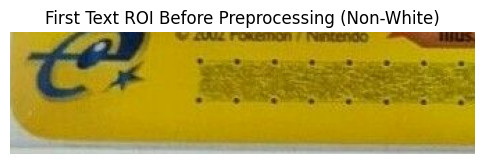

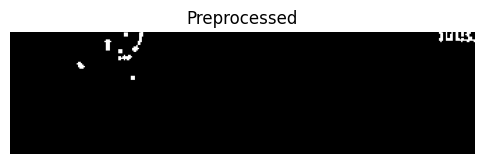

OCR result: []


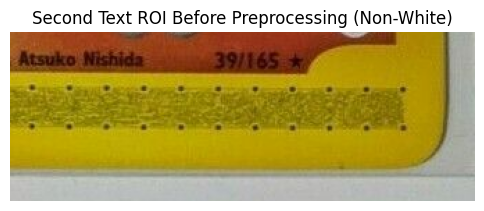

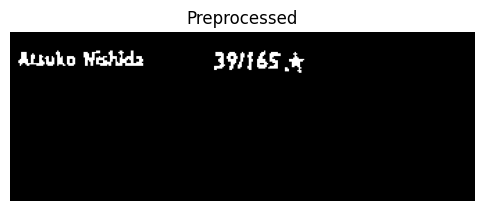

OCR result: ['AJuko Hahd', '39/165 4']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Model Prediction: ROI Bottom Right, Class: Next Destinies, Confidence: 1.0000


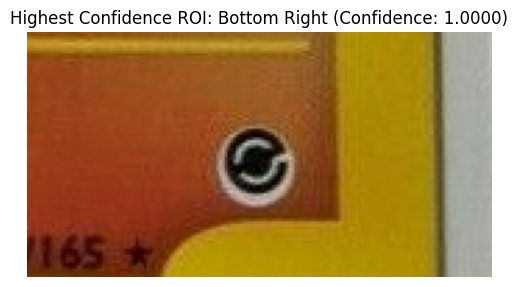

NameError: name 'image_bgr' is not defined

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import easyocr
from PIL import Image
from collections import Counter
import re
from tensorflow.keras.models import load_model
import json

# Load the saved model
model = load_model(r"C:\Users\Jimmy\Desktop\final-project\PokemonTCG\models\model06.keras")

# Load the class names (saved class indices from JSON file)
with open(r'C:\Users\Jimmy\Desktop\final-project\class_indices.json', 'r') as f:
    class_indices = json.load(f)

# Reverse the dictionary to map numeric labels to class names
class_names = {v: k for k, v in class_indices.items()}

# Initialize EasyOCR reader (use 'en' for English)
reader = easyocr.Reader(['en'])

# Function to classify a card as white or non-white
def classify_card(image_rgb):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    mean_brightness = np.mean(gray)
    
    if mean_brightness > 150:
        return "white"
    else:
        return "non_white"


# Function to adjust brightness and contrast
def adjust_brightness_contrast(image, alpha=2, beta=25):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)


# Function to display images for debugging
def debug_show_image(image, title="Image"):
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.show()


# Preprocessing to identify all colors that are not black and turn them into white
def ocr_preprocessing1(image_roi):
    roi_gray = cv2.cvtColor(image_roi, cv2.COLOR_BGR2GRAY)
    _, roi_thresh_black = cv2.threshold(roi_gray, 30, 255, cv2.THRESH_BINARY)
    
    roi_contrast = adjust_brightness_contrast(roi_thresh_black, alpha=1.5, beta=30)
    roi_blur = cv2.GaussianBlur(roi_contrast, (3, 3), 0)
    roi_thresh = cv2.adaptiveThreshold(roi_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY_INV, 11, 2)
    roi_sharpen = cv2.filter2D(roi_thresh, -1, np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))
    
    debug_show_image(roi_sharpen, title="Preprocessed")
    return roi_sharpen


# OCR processing with EasyOCR
def perform_ocr_easyocr(image_roi):
    # Perform OCR using EasyOCR
    result = reader.readtext(image_roi, detail=0)
    print(f"OCR result: {result}")
    
    return result

# Function to process OCR results and select only the valid match
def process_ocr_results(ocr_results):
    # Define the patterns for the two cases
    pattern_letters_digits = r'[a-zA-Z]{2,4}\d{1,3}'  # 2-4 letters followed by 1-3 numbers
    pattern_numbers_slash = r'\d{1,3}/\d{2,3}'  # 1-3 numbers followed by / and 2-3 numbers

    for result in ocr_results:
        # Try to match both patterns
        match_letters_digits = re.search(pattern_letters_digits, result)
        match_numbers_slash = re.search(pattern_numbers_slash, result)

        # Return only the matched portion, if found
        if match_letters_digits:
            return match_letters_digits.group()  # Return the first valid match for letters-digits
        elif match_numbers_slash:
            return match_numbers_slash.group()  # Return the first valid match for numbers-slash

    return None  # Return None if no valid match is found

def convert_non_black_to_white(roi):
    """
    Converts all non-black pixels in the ROI to white, keeping the image in RGB format.
    """
    # Threshold to detect non-black pixels (any pixel not close to [0, 0, 0])
    non_black_mask = np.any(roi > [30, 30, 30], axis=-1)  # You can adjust the threshold value

    # Create a copy of the ROI
    processed_roi = roi.copy()

    # Set non-black pixels to white
    processed_roi[non_black_mask] = [255, 255, 255]  # Turn non-black areas to white

    return processed_roi

# Function to apply the model to all three ROIs and rank by confidence score
def apply_model_to_rois(model, roi_bottom_left, roi_bottom_right, roi_middle):
    roi_bottom_left_processed = convert_non_black_to_white(roi_bottom_left)
    roi_bottom_right_processed = convert_non_black_to_white(roi_bottom_right)
    roi_middle_processed = convert_non_black_to_white(roi_middle)

    if len(roi_bottom_left_processed.shape) == 2:
        roi_bottom_left_processed = cv2.cvtColor(roi_bottom_left_processed, cv2.COLOR_GRAY2RGB)
    if len(roi_bottom_right_processed.shape) == 2:
        roi_bottom_right_processed = cv2.cvtColor(roi_bottom_right_processed, cv2.COLOR_GRAY2RGB)
    if len(roi_middle_processed.shape) == 2:
        roi_middle_processed = cv2.cvtColor(roi_middle_processed, cv2.COLOR_GRAY2RGB)

    roi_bottom_left_resized = cv2.resize(roi_bottom_left_processed, (150, 150))
    roi_bottom_right_resized = cv2.resize(roi_bottom_right_processed, (150, 150))
    roi_middle_resized = cv2.resize(roi_middle_processed, (150, 150))

    roi_bottom_left_exp = np.expand_dims(roi_bottom_left_resized, axis=0)
    roi_bottom_right_exp = np.expand_dims(roi_bottom_right_resized, axis=0)
    roi_middle_exp = np.expand_dims(roi_middle_resized, axis=0)

    prediction_bottom_left = model.predict(roi_bottom_left_exp)
    prediction_bottom_right = model.predict(roi_bottom_right_exp)
    prediction_middle = model.predict(roi_middle_exp)

    confidence_bottom_left = np.max(prediction_bottom_left)
    class_bottom_left = np.argmax(prediction_bottom_left)

    confidence_bottom_right = np.max(prediction_bottom_right)
    class_bottom_right = np.argmax(prediction_bottom_right)

    confidence_middle = np.max(prediction_middle)
    class_middle = np.argmax(prediction_middle)

    # Map class index to class name
    class_name_bottom_left = class_names.get(class_bottom_left, "Unknown")
    class_name_bottom_right = class_names.get(class_bottom_right, "Unknown")
    class_name_middle = class_names.get(class_middle, "Unknown")

    results = [
        (confidence_bottom_left, class_name_bottom_left, 'Bottom Left'),
        (confidence_bottom_right, class_name_bottom_right, 'Bottom Right'),
        (confidence_middle, class_name_middle, 'Middle')
    ]

    results_sorted = sorted(results, key=lambda x: x[0], reverse=True)
    return results_sorted




# Function to extract bounding boxes and run OCR on white cards
def draw_bounding_box_white(image_bgr, model):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI (for OCR) ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_bgr[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_bgr[second_text_roi_y_start:text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # --- Decision: Keep only one OCR result ---
        processed_ocr_result_first = process_ocr_results(ocr_results_first)
        processed_ocr_result_second = process_ocr_results(ocr_results_second)

        final_ocr_result = processed_ocr_result_first if processed_ocr_result_first else processed_ocr_result_second

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_middle_coords = (x + 3 * w // 4, y + h // 2, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)

        # Extract ROIs based on the coordinates
        roi_bottom_left = image_bgr[roi_bottom_left_coords[1]:roi_bottom_left_coords[1] + roi_bottom_left_coords[3],
                                    roi_bottom_left_coords[0]:roi_bottom_left_coords[0] + roi_bottom_left_coords[2]]
        roi_middle = image_bgr[roi_middle_coords[1]:roi_middle_coords[1] + roi_middle_coords[3],
                            roi_middle_coords[0]:roi_middle_coords[0] + roi_middle_coords[2]]
        roi_bottom_right = image_bgr[roi_bottom_right_coords[1]:roi_bottom_right_coords[1] + roi_bottom_right_coords[3],
                                    roi_bottom_right_coords[0]:roi_bottom_right_coords[0] + roi_bottom_right_coords[2]]

        # Apply model to each ROI (actual extracted ROIs, not coordinates)
        results = apply_model_to_rois(model, roi_bottom_left, roi_bottom_right, roi_middle)

        # Get the highest confidence prediction
        best_prediction = results[0]
        confidence, predicted_class, roi_name = best_prediction
        
        # Print or log the model's result
        print(f"Model Prediction: ROI {roi_name}, Class: {predicted_class}, Confidence: {confidence:.4f}")

        # Display the highest confidence ROI immediately
        highest_conf_roi = None
        if roi_name == 'Bottom Left':
            highest_conf_roi = roi_bottom_left
        elif roi_name == 'Bottom Right':
            highest_conf_roi = roi_bottom_right
        else:
            highest_conf_roi = roi_middle

        # Display the highest confidence ROI using matplotlib
        plt.figure(figsize=(6, 6))
        plt.imshow(highest_conf_roi)
        plt.title(f"Highest Confidence ROI: {roi_name} (Confidence: {confidence:.4f})")
        plt.axis('off')
        plt.show()

        # Draw all ROIs and bounding boxes on the original image (use the same coordinates)
        image_with_rois = image_bgr.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Bounding box around the entire object

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)

        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), 
                    (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow), using the same coordinates from the extracted ROIs
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                    (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]), (255, 255, 0), 2)

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                    (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]), (255, 255, 0), 2)

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                    (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]), (255, 255, 0), 2)

        return image_with_rois, final_ocr_result

    else:
        print("No contours found.")
        return image_bgr, None



# Function to extract bounding boxes and run OCR on non-white cards
def draw_bounding_boxes(image_rgb, threshold_value, model):
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    _, thresholded = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresholded, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # --- First Text ROI ---
        text_roi_height = h // 10
        text_roi_width = int(w * 0.5)
        text_roi_y_start = y + h - text_roi_height
        first_text_roi = image_rgb[text_roi_y_start:text_roi_y_start + text_roi_height, x:x + text_roi_width]

        # Debugging: show the first ROI before preprocessing
        debug_show_image(first_text_roi, title="First Text ROI Before Preprocessing (Non-White)")

        processed_first_text_roi = ocr_preprocessing1(first_text_roi)
        ocr_results_first = perform_ocr_easyocr(processed_first_text_roi)

        # --- Second Text ROI ---
        second_text_roi_height = int(text_roi_height * 1.2)
        second_text_roi_x_start = x + w - text_roi_width
        second_text_roi_y_start = y + h - second_text_roi_height
        second_text_roi = image_rgb[second_text_roi_y_start:text_roi_y_start + second_text_roi_height,
                                    second_text_roi_x_start:second_text_roi_x_start + text_roi_width]

        # Debugging: show the second ROI before preprocessing
        debug_show_image(second_text_roi, title="Second Text ROI Before Preprocessing (Non-White)")

        processed_second_text_roi = ocr_preprocessing1(second_text_roi)
        ocr_results_second = perform_ocr_easyocr(processed_second_text_roi)

        # --- Decision: Keep only one OCR result ---
        processed_ocr_result_first = process_ocr_results(ocr_results_first)
        processed_ocr_result_second = process_ocr_results(ocr_results_second)

        final_ocr_result = processed_ocr_result_first if processed_ocr_result_first else processed_ocr_result_second

        # --- Set Symbol ROIs ---
        roi_bottom_left_coords = (x, y + h - text_roi_height, w // 4, text_roi_height)
        roi_middle_coords = (x + 3 * w // 4, y + h // 2, w // 4, text_roi_height)
        roi_bottom_right_y_adjusted = y + h - 2 * text_roi_height + int(0.15 * text_roi_height)
        roi_bottom_right_coords = (x + w // 2 + w // 4, roi_bottom_right_y_adjusted, w // 4, text_roi_height)

        # Extract ROIs based on the coordinates
        roi_bottom_left = image_rgb[roi_bottom_left_coords[1]:roi_bottom_left_coords[1] + roi_bottom_left_coords[3],
                                    roi_bottom_left_coords[0]:roi_bottom_left_coords[0] + roi_bottom_left_coords[2]]
        roi_middle = image_rgb[roi_middle_coords[1]:roi_middle_coords[1] + roi_middle_coords[3],
                            roi_middle_coords[0]:roi_middle_coords[0] + roi_middle_coords[2]]
        roi_bottom_right = image_rgb[roi_bottom_right_coords[1]:roi_bottom_right_coords[1] + roi_bottom_right_coords[3],
                                    roi_bottom_right_coords[0]:roi_bottom_right_coords[0] + roi_bottom_right_coords[2]]

        # Apply model to each ROI (actual extracted ROIs, not coordinates)
        results = apply_model_to_rois(model, roi_bottom_left, roi_bottom_right, roi_middle)

        # Get the highest confidence prediction
        best_prediction = results[0]
        confidence, predicted_class, roi_name = best_prediction
        
        # Print or log the model's result
        print(f"Model Prediction: ROI {roi_name}, Class: {predicted_class}, Confidence: {confidence:.4f}")

        # Display the highest confidence ROI immediately
        highest_conf_roi = None
        if roi_name == 'Bottom Left':
            highest_conf_roi = roi_bottom_left
        elif roi_name == 'Bottom Right':
            highest_conf_roi = roi_bottom_right
        else:
            highest_conf_roi = roi_middle

        # Display the highest confidence ROI using matplotlib
        plt.figure(figsize=(6, 6))
        plt.imshow(highest_conf_roi)
        plt.title(f"Highest Confidence ROI: {roi_name} (Confidence: {confidence:.4f})")
        plt.axis('off')
        plt.show()

        # Draw all ROIs and bounding boxes on the original image (use the same coordinates)
        image_with_rois = image_bgr.copy()
        cv2.rectangle(image_with_rois, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Bounding box around the entire object

        # Draw the first text ROI (blue)
        cv2.rectangle(image_with_rois, (x, text_roi_y_start), (x + text_roi_width, text_roi_y_start + text_roi_height), (255, 0, 0), 2)

        # Draw the second text ROI (red)
        cv2.rectangle(image_with_rois, (second_text_roi_x_start, second_text_roi_y_start), 
                    (second_text_roi_x_start + text_roi_width, second_text_roi_y_start + second_text_roi_height), (255, 0, 0), 2)

        # Draw the three set symbol ROIs (yellow), using the same coordinates from the extracted ROIs
        cv2.rectangle(image_with_rois, (roi_bottom_left_coords[0], roi_bottom_left_coords[1]),
                    (roi_bottom_left_coords[0] + roi_bottom_left_coords[2], roi_bottom_left_coords[1] + roi_bottom_left_coords[3]), (255, 255, 0), 2)

        cv2.rectangle(image_with_rois, (roi_bottom_right_coords[0], roi_bottom_right_coords[1]),
                    (roi_bottom_right_coords[0] + roi_bottom_right_coords[2], roi_bottom_right_coords[1] + roi_bottom_right_coords[3]), (255, 255, 0), 2)

        cv2.rectangle(image_with_rois, (roi_middle_coords[0], roi_middle_coords[1]),
                    (roi_middle_coords[0] + roi_middle_coords[2], roi_middle_coords[1] + roi_middle_coords[3]), (255, 255, 0), 2)

        return image_with_rois, final_ocr_result

    else:
        print("No contours found.")
        return image_rgb, None


# Main function to handle both white and non-white cards
def bounding_box_roi(image_rgb, model):
    card_type = classify_card(image_rgb)

    if card_type == "white":
        # Handle white cards
        image_with_bounding_box, ocr_result= draw_bounding_box_white(image_rgb, model)
    else:
        # Handle non-white cards
        threshold_value = 160
        image_with_bounding_box, ocr_result= draw_bounding_boxes(image_rgb, threshold_value, model)

    return image_with_bounding_box, ocr_result


# Test with the images (replace with actual image paths)
charizard_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\image-0.jpg')  # Replace with actual path
charizard_rgb = cv2.cvtColor(charizard_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

eevee_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\s-l1200.jpg')  # Replace with actual path
eevee_rgb = cv2.cvtColor(eevee_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

dragonite_rgb = cv2.imread(r'C:\Users\Jimmy\Desktop\cb-ds-19\00_Projects\ds-final-project-main\Test Image\e-reader.webp')  # Replace with actual path
dragonite_rgb = cv2.cvtColor(dragonite_rgb, cv2.COLOR_BGR2RGB)  # Ensure correct format

# Apply the dynamic threshold function to all images
charizard_output, charizard_ocr_results= bounding_box_roi(charizard_rgb, model)
eevee_output, eevee_ocr_results= bounding_box_roi(eevee_rgb, model)
dragonite_output, dragonite_ocr_results= bounding_box_roi(dragonite_rgb, model)


# Display the results for all cards with classification
plt.figure(figsize=(20, 15))

# Charizard
plt.subplot(2, 2, 1)
plt.imshow(charizard_output)
plt.title(f"Charizard - {charizard_ocr_results}")
plt.axis("off")


# Eevee
plt.subplot(2, 2, 2)
plt.imshow(eevee_output)
plt.title(f"Eevee - {eevee_ocr_results}")
plt.axis("off")

# Dragonite
plt.subplot(2, 2, 3)
plt.imshow(dragonite_output)
plt.title(f"Dragonite - {dragonite_ocr_results}")
plt.axis("off")

plt.tight_layout()
plt.show()

